In [1]:
import numpy as np
import pandas as pd
pd.set_option("display.max_columns", 500)

import copy, pickle, bentoml
from tqdm import tqdm 
from datetime import datetime

from sklearn.model_selection import train_test_split, GridSearchCV, RepeatedStratifiedKFold

import pandas_profiling
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LogisticRegression

from catboost import CatBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier 
from category_encoders import OneHotEncoder

from category_encoders import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer

from sklearn.metrics import roc_auc_score, balanced_accuracy_score
import matplotlib
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sns

# Отключаю предупреждения от Anaconda
import warnings
warnings.filterwarnings('ignore')

In [2]:
path = "/Users/salikh-khabibullin/Desktop/HDDA/"
data = pd.read_csv(path + "hotel_bookings.csv")
print(data.shape)

(119390, 32)


In [3]:
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [4]:
data.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


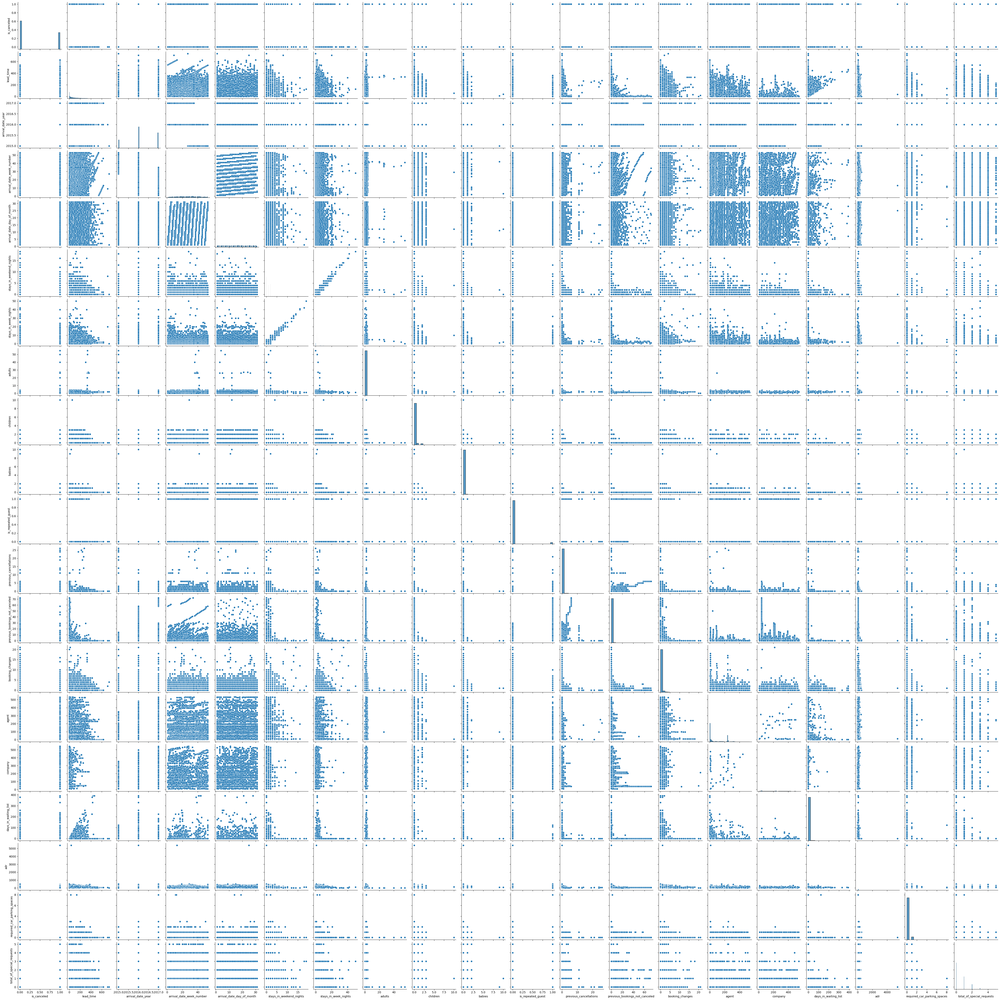

CPU times: user 1min 10s, sys: 1.23 s, total: 1min 11s
Wall time: 1min 9s


In [5]:
%%time

sns.pairplot(data)
plt.show()

In [6]:
y = data["is_canceled"]
data.drop(["is_canceled"], axis = 1, inplace = True)
data.drop(["reservation_status"], axis = 1, inplace = True) # if statement 

# experiment (to have no Ideal model)
data.drop(["reservation_status_date"], axis = 1, inplace = True) 

print(data.shape)

(119390, 29)


In [7]:
data.head()

,hotel,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
0,Resort Hotel,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0
1,Resort Hotel,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0
2,Resort Hotel,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0
3,Resort Hotel,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0
4,Resort Hotel,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1


In [8]:
# I understand that there is imbalance but it isn't strong

y.value_counts() #normalize=True

0    75166
1    44224
Name: is_canceled, dtype: int64

In [9]:
%%time

profileReport = pandas_profiling.profile_report.ProfileReport(data, title = "Just_Report")
profileReport.to_file("report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

CPU times: user 2min 23s, sys: 32.2 s, total: 2min 55s
Wall time: 39.1 s


In [10]:
profileReport

In [9]:
data.isnull().sum()

hotel                                  0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company                           112593
days_in_waiting_

In [10]:
# Let's just see features with NaNs - country, children, agent, company
data["country"].value_counts()

PRT    48590
GBR    12129
FRA    10415
ESP     8568
DEU     7287
       ...  
DJI        1
BWA        1
HND        1
VGB        1
NAM        1
Name: country, Length: 177, dtype: int64

In [11]:
data["children"].value_counts()

0.0     110796
1.0       4861
2.0       3652
3.0         76
10.0         1
Name: children, dtype: int64

In [12]:
data["agent"].value_counts()

9.0      31961
240.0    13922
1.0       7191
14.0      3640
7.0       3539
         ...  
289.0        1
432.0        1
265.0        1
93.0         1
304.0        1
Name: agent, Length: 333, dtype: int64

In [13]:
data["company"].value_counts()

40.0     927
223.0    784
67.0     267
45.0     250
153.0    215
        ... 
104.0      1
531.0      1
160.0      1
413.0      1
386.0      1
Name: company, Length: 352, dtype: int64

In [14]:
# I decided to make agent and company categorical - because they are all unique 
# and they can't be compared like interers 
data["agent"] = data["agent"].astype("str")
data["company"] = data["company"].astype("str")

In [15]:
X_train, X_test, y_train, y_test = train_test_split(data, y, test_size = 0.2, random_state=42)
print(X_train.shape, X_test.shape)

(95512, 29) (23878, 29)


In [16]:
X_train.head()

,hotel,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
67702,City Hotel,64,2017,May,18,6,2,1,3,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,nan,0,Transient,189.00,0,0
115851,City Hotel,34,2017,July,28,10,1,1,2,1.0,0,BB,FRA,Direct,Direct,0,0,0,A,A,0,No Deposit,14.0,nan,0,Transient,146.00,0,0
57345,City Hotel,8,2016,September,39,24,1,1,2,2.0,0,BB,ESP,Online TA,TA/TO,0,0,0,F,F,0,No Deposit,9.0,nan,0,Transient,259.00,0,0
11622,Resort Hotel,251,2017,May,21,21,2,4,2,0.0,0,BB,FRA,Direct,Direct,0,0,0,E,E,0,No Deposit,nan,nan,0,Transient,89.70,0,1
33333,Resort Hotel,23,2017,February,7,18,1,1,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,241.0,nan,0,Transient,42.43,0,1


In [17]:
X_test.head()

,hotel,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
30946,Resort Hotel,203,2016,December,49,2,2,5,2,0.0,0,BB,GBR,Direct,Direct,0,0,0,F,F,4,No Deposit,250.0,nan,0,Transient,66.8,0,0
40207,City Hotel,82,2015,July,29,16,0,3,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,nan,0,Transient,76.5,0,0
103708,City Hotel,25,2016,December,53,27,0,3,3,0.0,0,BB,BRA,Offline TA/TO,TA/TO,0,0,0,A,K,2,No Deposit,220.0,nan,0,Transient-Party,60.0,0,1
85144,City Hotel,1,2016,March,11,9,0,1,1,0.0,0,BB,SWE,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,nan,0,Transient-Party,95.0,0,0
109991,City Hotel,70,2017,April,16,16,2,2,2,0.0,0,SC,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9.0,nan,0,Transient,108.0,0,0


In [18]:
# Let's find out what features are numeric, and which are categorical
features = list(X_train.columns)
print("features : ", features, "\n")
num = [cname for cname in features if X_train[cname].dtype in ['int64', 'float64']]
cat = [cname for cname in features if X_train[cname].dtype == "object"]
time = [cname for cname in features if X_train[cname].dtype == "<M8[ns]"]
    
print(len(num), " num_cols : ", num, "\n")
print(len(cat), " cat_cols : ", cat, "\n")
print(len(time), " time_cols : ", time, "\n")

features :  ['hotel', 'lead_time', 'arrival_date_year', 'arrival_date_month', 'arrival_date_week_number', 'arrival_date_day_of_month', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'meal', 'country', 'market_segment', 'distribution_channel', 'is_repeated_guest', 'previous_cancellations', 'previous_bookings_not_canceled', 'reserved_room_type', 'assigned_room_type', 'booking_changes', 'deposit_type', 'agent', 'company', 'days_in_waiting_list', 'customer_type', 'adr', 'required_car_parking_spaces', 'total_of_special_requests'] 

17  num_cols :  ['lead_time', 'arrival_date_year', 'arrival_date_week_number', 'arrival_date_day_of_month', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'is_repeated_guest', 'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'days_in_waiting_list', 'adr', 'required_car_parking_spaces', 'total_of_special_requests'] 

12  cat_cols :  ['hotel', 'arrival_date_month',

In [19]:
# maybe to have more score in metrics it'snecessary
# to make 'arrival_date_year', 'arrival_date_week_number', 'arrival_date_day_of_month' categorical
# because they are not naked integers

In [20]:
num

['lead_time',
 'arrival_date_year',
 'arrival_date_week_number',
 'arrival_date_day_of_month',
 'stays_in_weekend_nights',
 'stays_in_week_nights',
 'adults',
 'children',
 'babies',
 'is_repeated_guest',
 'previous_cancellations',
 'previous_bookings_not_canceled',
 'booking_changes',
 'days_in_waiting_list',
 'adr',
 'required_car_parking_spaces',
 'total_of_special_requests']

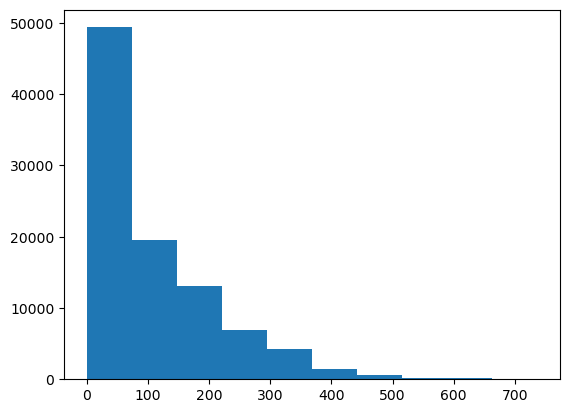

In [21]:
# Just see the plot
plt.hist(X_train["lead_time"]);

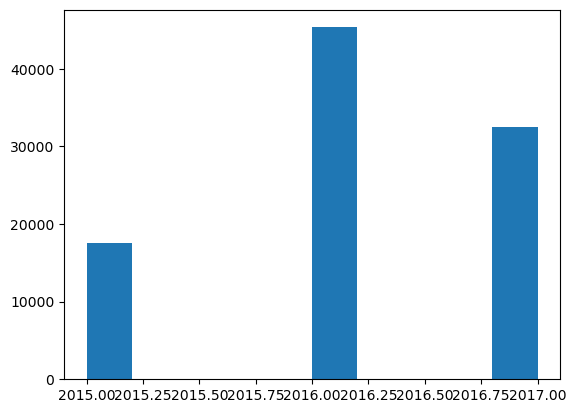

In [22]:
plt.hist(X_train["arrival_date_year"]);

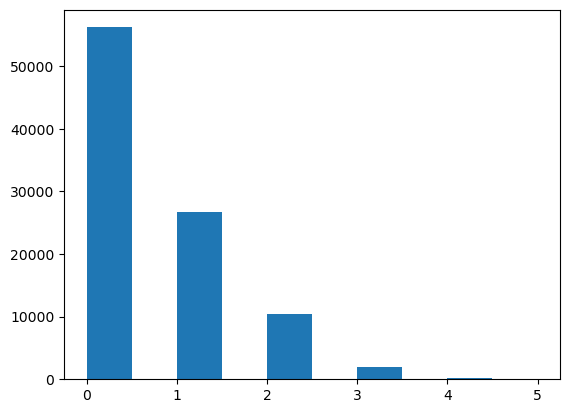

In [23]:
plt.hist(X_train["total_of_special_requests"]);

In [24]:
cat

['hotel',
 'arrival_date_month',
 'meal',
 'country',
 'market_segment',
 'distribution_channel',
 'reserved_room_type',
 'assigned_room_type',
 'deposit_type',
 'agent',
 'company',
 'customer_type']

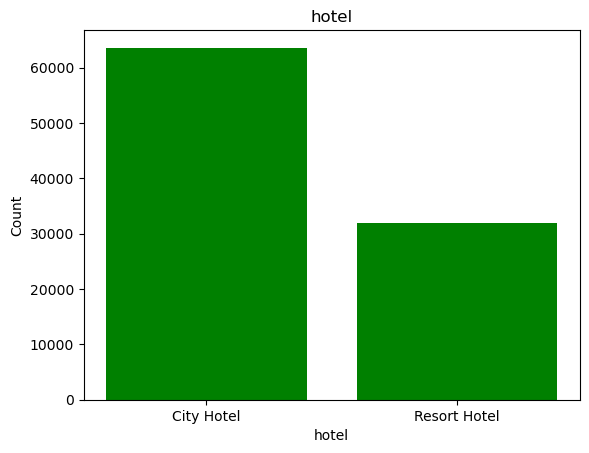

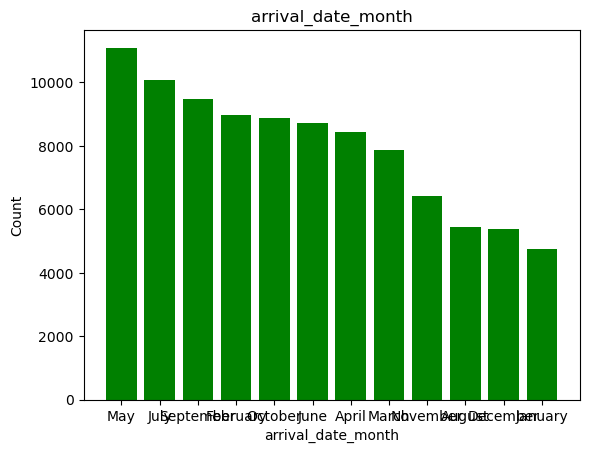

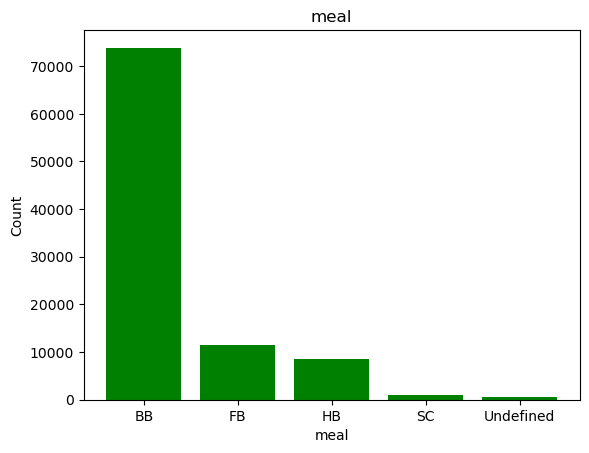

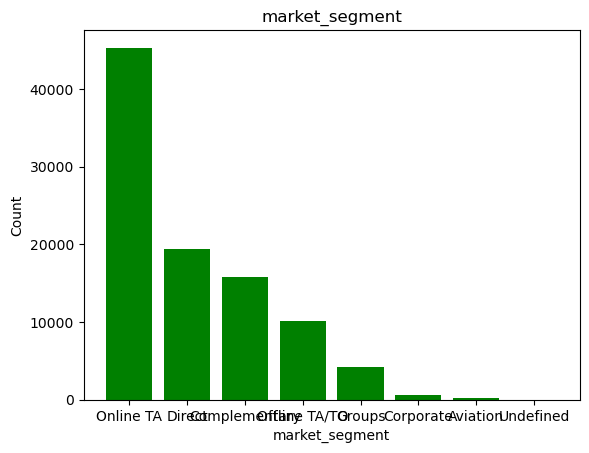

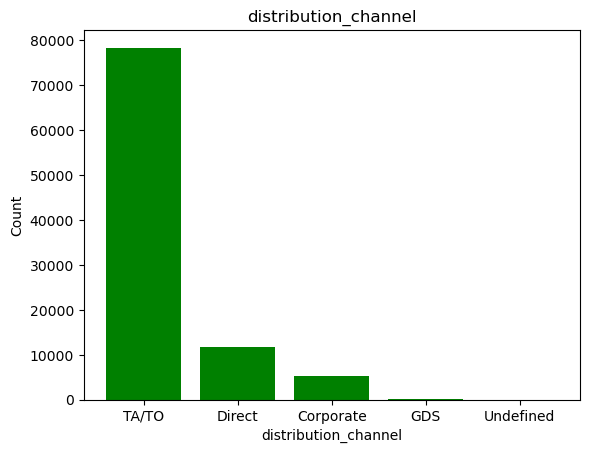

...

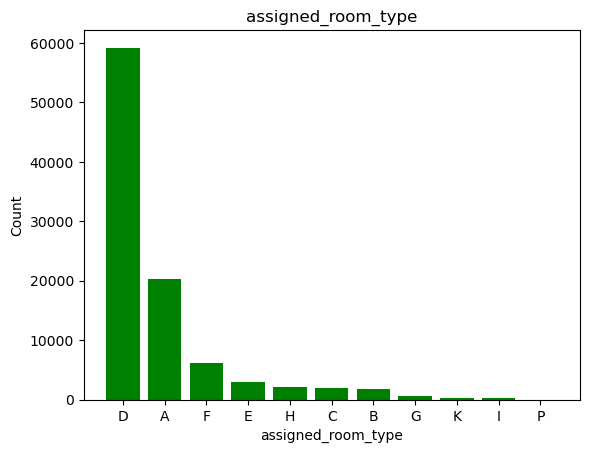

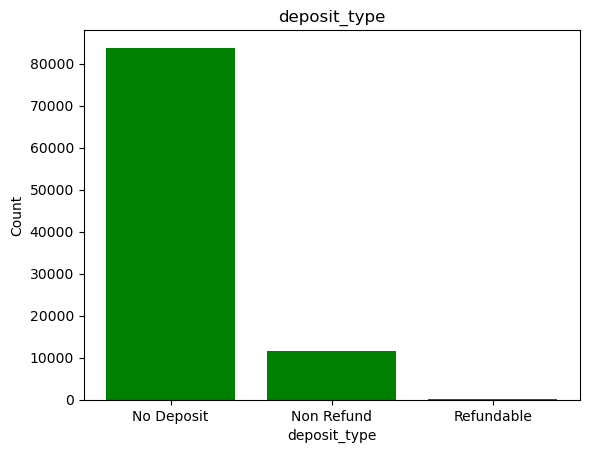

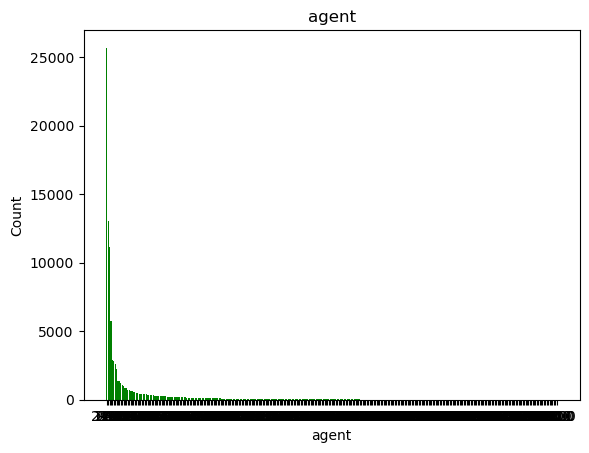

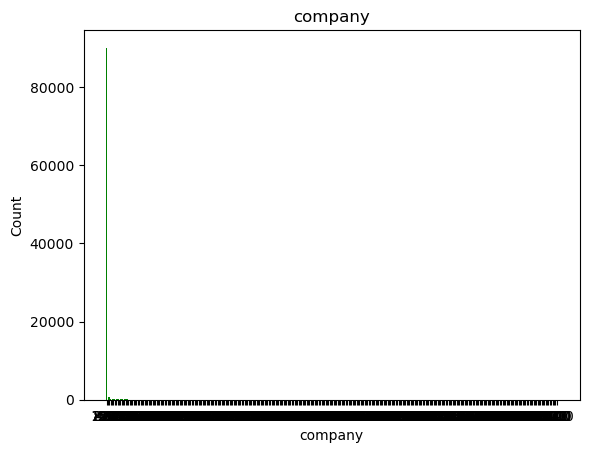

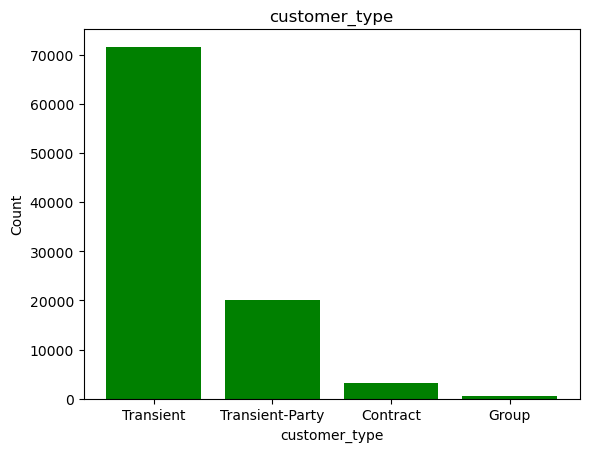

In [25]:
# Just see the plot of categorical features
for f in cat:
    if f != "country":
        plt.bar(X_train[f].unique(), X_train[f].value_counts(), color = 'green')
        plt.xlabel(f)
        plt.ylabel("Count")
        plt.title(f)

        plt.show()

In [26]:
# First model - throw out column "company" because too many NaNs
# reservation_status_date duplicate arrival_date_year, arrival_date_month, 
# arrival_date_week_number, arrival_date_day_of_month but in some cases it's differ

In [27]:
imputer = SimpleImputer(missing_values=np.nan, strategy = "most_frequent")

X_train["children"] = imputer.fit_transform(X_train["children"].values.reshape(-1, 1))
X_test["children"] = imputer.transform(X_test["children"].values.reshape(-1, 1))

In [28]:
# list of categorical features with NaNs
small_cat = ["country", "agent", "company"]

for a in small_cat:
    imputer = SimpleImputer(missing_values=np.nan, strategy = "most_frequent")

    X_train[a] = imputer.fit_transform(X_train[a].values.reshape(-1, 1))
    X_test[a] = imputer.transform(X_test[a].values.reshape(-1, 1))

# list of categorical features with NaNs
# If you want to ухудщить model because all metrics are 3.14)))
small_cat = ["country", "agent", "company"]
for a in small_cat:
    X_train[a] = X_train[a].fillna(-5)
    X_test[a] = X_test[a].fillna(-5)

In [29]:
X_train.isnull().sum().sum()

0

In [30]:
X_test.isnull().sum().sum()

0

In [31]:
# Я прекрасно знаю, что scaler для CatBoostClassifier погоду не делает - но просто применил

scaler = StandardScaler()

X_train[num] = scaler.fit_transform(X_train[num])
X_test[num] = scaler.transform(X_test[num])

In [32]:
X_train.head()

,hotel,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
67702,City Hotel,-0.373594,1.19217,May,-0.673943,-1.112827,1.073203,-0.785244,2.001135,-0.260570,-0.084135,BB,GBR,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,D,D,-0.338816,No Deposit,9.0,nan,-0.131883,Transient,1.701676,-0.255002,-0.721827
115851,City Hotel,-0.654357,1.19217,July,0.061192,-0.657549,0.072971,-0.785244,0.251591,2.251039,-0.084135,BB,FRA,Direct,Direct,-0.180852,-0.102765,-0.090206,A,A,-0.338816,No Deposit,14.0,nan,-0.131883,Transient,0.861689,-0.255002,-0.721827
57345,City Hotel,-0.897685,-0.22111,September,0.869840,0.935925,0.072971,-0.785244,0.251591,4.762648,-0.084135,BB,ESP,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,F,F,-0.338816,No Deposit,9.0,nan,-0.131883,Transient,3.069098,-0.255002,-0.721827
11622,Resort Hotel,1.376493,1.19217,May,-0.453403,0.594466,1.073203,0.784849,0.251591,-0.260570,-0.084135,BB,FRA,Direct,Direct,-0.180852,-0.102765,-0.090206,E,E,-0.338816,No Deposit,nan,nan,-0.131883,Transient,-0.238109,-0.255002,0.540128
33333,Resort Hotel,-0.757303,1.19217,February,-1.482591,0.253008,0.072971,-0.785244,0.251591,-0.260570,-0.084135,BB,GBR,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,D,D,-0.338816,No Deposit,241.0,nan,-0.131883,Transient,-1.161509,-0.255002,0.540128


In [33]:
X_train.head()

,hotel,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
67702,City Hotel,-0.373594,1.19217,May,-0.673943,-1.112827,1.073203,-0.785244,2.001135,-0.260570,-0.084135,BB,GBR,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,D,D,-0.338816,No Deposit,9.0,nan,-0.131883,Transient,1.701676,-0.255002,-0.721827
115851,City Hotel,-0.654357,1.19217,July,0.061192,-0.657549,0.072971,-0.785244,0.251591,2.251039,-0.084135,BB,FRA,Direct,Direct,-0.180852,-0.102765,-0.090206,A,A,-0.338816,No Deposit,14.0,nan,-0.131883,Transient,0.861689,-0.255002,-0.721827
57345,City Hotel,-0.897685,-0.22111,September,0.869840,0.935925,0.072971,-0.785244,0.251591,4.762648,-0.084135,BB,ESP,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,F,F,-0.338816,No Deposit,9.0,nan,-0.131883,Transient,3.069098,-0.255002,-0.721827
11622,Resort Hotel,1.376493,1.19217,May,-0.453403,0.594466,1.073203,0.784849,0.251591,-0.260570,-0.084135,BB,FRA,Direct,Direct,-0.180852,-0.102765,-0.090206,E,E,-0.338816,No Deposit,nan,nan,-0.131883,Transient,-0.238109,-0.255002,0.540128
33333,Resort Hotel,-0.757303,1.19217,February,-1.482591,0.253008,0.072971,-0.785244,0.251591,-0.260570,-0.084135,BB,GBR,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,D,D,-0.338816,No Deposit,241.0,nan,-0.131883,Transient,-1.161509,-0.255002,0.540128


In [34]:
# create validation part
X_tr, X_val, y_tr, y_val = train_test_split(X_train, y_train, test_size = 0.1, random_state = 42)
print(X_tr.shape, X_val.shape)

(85960, 29) (9552, 29)


In [35]:
X_tr.head()

,hotel,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
50541,City Hotel,0.384465,-0.22111,May,-0.600430,-1.454286,-0.927261,0.784849,0.251591,-0.26057,-0.084135,BB,DEU,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,A,A,-0.338816,No Deposit,9.0,nan,-0.131883,Transient-Party,-0.047646,-0.255002,-0.721827
61538,City Hotel,-0.448464,-0.22111,December,1.752001,0.025368,-0.927261,-0.261880,0.251591,-0.26057,-0.084135,SC,NLD,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,A,A,5.798293,No Deposit,9.0,nan,-0.131883,Transient,-0.443222,-0.255002,0.540128
54029,City Hotel,-0.289365,-0.22111,July,0.061192,-1.112827,-0.927261,0.784849,2.001135,-0.26057,-0.084135,BB,ITA,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,D,D,-0.338816,No Deposit,9.0,nan,-0.131883,Transient,0.928107,-0.255002,-0.721827
56126,City Hotel,-0.467182,-0.22111,August,0.649299,1.505023,1.073203,1.308214,0.251591,-0.26057,-0.084135,BB,PRT,Direct,Direct,-0.180852,-0.102765,-0.090206,D,D,-0.338816,No Deposit,nan,nan,-0.131883,Transient,0.218024,-0.255002,-0.721827
105369,City Hotel,-0.832173,1.19217,February,-1.629618,-1.340466,0.072971,-0.785244,0.251591,-0.26057,-0.084135,BB,BEL,Direct,Direct,-0.180852,-0.102765,-0.090206,A,A,1.195461,No Deposit,14.0,nan,-0.131883,Transient,-0.075972,-0.255002,-0.721827


In [36]:
X_val.head()

,hotel,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
117752,City Hotel,-0.850891,1.19217,August,0.355246,-1.112827,1.073203,-0.785244,0.251591,-0.260570,-0.084135,BB,DEU,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,A,A,-0.338816,No Deposit,9.0,nan,-0.131883,Transient,1.525865,-0.255002,-0.721827
23383,Resort Hotel,-0.963196,-0.22111,April,-0.747456,0.822105,-0.927261,-0.785244,0.251591,-0.260570,-0.084135,BB,ESP,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,A,D,-0.338816,No Deposit,240.0,nan,-0.131883,Transient,-0.290852,-0.255002,-0.721827
108866,City Hotel,0.843044,1.19217,April,-1.041510,-1.681925,0.072971,-0.785244,0.251591,-0.260570,-0.084135,BB,FRA,Offline TA/TO,TA/TO,-0.180852,-0.102765,-0.090206,A,D,-0.338816,No Deposit,28.0,nan,-0.131883,Transient,-0.525267,-0.255002,-0.721827
98811,City Hotel,0.515488,-0.22111,September,0.943353,1.618842,1.073203,0.261485,0.251591,-0.260570,-0.084135,BB,FRA,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,D,D,-0.338816,No Deposit,9.0,nan,-0.131883,Transient,0.636260,-0.255002,1.802083
67456,City Hotel,1.030219,1.19217,May,-0.673943,-1.454286,-0.927261,0.784849,0.251591,2.251039,-0.084135,BB,POL,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,A,A,-0.338816,No Deposit,9.0,nan,-0.131883,Transient,0.611646,-0.255002,1.802083


# CatBoost

In [40]:
params = {'eval_metric':'AUC',
          'verbose': 1000,
          #'iterations': 10000,
          'cat_features': cat,
          'random_seed': 1,}

model_1 = CatBoostClassifier(**params);
model_1.fit(X_tr, y_tr, 
            eval_set = (X_val, y_val),   
            use_best_model = True, 
            plot = True);

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.095209
0:	test: 0.8434772	best: 0.8434772 (0)	total: 117ms	remaining: 1m 57s
999:	test: 0.9578627	best: 0.9578627 (999)	total: 48.9s	remaining: 0us

bestTest = 0.9578627221
bestIteration = 999



In [41]:
model_1.predict(X_test)

array([0, 1, 0, ..., 0, 0, 1])

In [42]:
def calc(model, test):
    preds = model.predict(test)
    roc_auc = roc_auc_score(y_test, preds)
    balanc_score = balanced_accuracy_score(y_test, preds)
    print(roc_auc, balanc_score)
    return roc_auc, balanc_score

In [43]:
roc_auc_1, balanc_score_1 = calc(model_1, X_test);

0.8771559756396095 0.8771559756396095


In [51]:
weights_1 = list(model_1.feature_importances_)
names_1 = list(model_1.feature_names_)

model_dict_1 = dict(zip(names_1, weights_1))
model_dict_1 = sorted(model_dict_1.items(), key=lambda x: x[1])[::-1] 

In [53]:
# watch the weight of model
model_dict_1

[('country', 13.816473568469371),
 ('deposit_type', 13.324579835911072),
 ('required_car_parking_spaces', 11.503847939022144),
 ('agent', 9.95672906814214),
 ('lead_time', 7.515830840770153),
 ('previous_cancellations', 6.895640951817576),
 ('customer_type', 5.170679044199764),
 ('market_segment', 4.844032485193806),
 ('arrival_date_year', 4.4406169035241465),
 ('total_of_special_requests', 3.976505323934358),
 ('adr', 2.52947885431496),
 ('arrival_date_week_number', 1.9818262992829712),
 ('booking_changes', 1.5883913455711585),
 ('assigned_room_type', 1.4934861299433895),
 ('reserved_room_type', 1.4501381815099468),
 ('distribution_channel', 1.3986739479459895),
 ('arrival_date_month', 1.3360083003210301),
 ('arrival_date_day_of_month', 1.1552714314754633),
 ('stays_in_week_nights', 0.9735394304430839),
 ('previous_bookings_not_canceled', 0.9123857103182212),
 ('meal', 0.8585442681794451),
 ('stays_in_weekend_nights', 0.671388857681338),
 ('hotel', 0.6098059516204822),
 ('days_in_wait

In [45]:
params = {#'custom_loss': 'AUC',
          'loss_function':'Logloss',
          'eval_metric':'AUC',
          #'learning_rate': 0.05,
          'verbose': 1000, 
          'iterations': 500, 
          #'metric_period': 1000,
          #'thread_count': 4,
          'od_type': 'Iter', 
          'l2_leaf_reg': 10,
          'depth': 10,
          'cat_features': cat,
          'random_seed': 1}

model_2 = CatBoostClassifier(**params);
model_2.fit(X_tr, y_tr, 
            eval_set = (X_val, y_val),   
            use_best_model = True, 
            plot = True);

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.8570701	best: 0.8570701 (0)	total: 146ms	remaining: 1m 12s
499:	test: 0.9563919	best: 0.9563919 (499)	total: 1m 2s	remaining: 0us

bestTest = 0.9563918895
bestIteration = 499



In [46]:
roc_auc_2, balanc_score_2 = calc(model_2, X_test);

0.8735553849689425 0.8735553849689425


In [49]:
weights_2 = list(model_2.feature_importances_)
names_2 = list(model_2.feature_names_)

model_dict_2 = dict(zip(names_2, weights_2))
model_dict_2 = sorted(model_dict_2.items(), key=lambda x: x[1])[::-1]

In [50]:
# watch the weight of model
model_dict_2

[('country', 15.466605683787902),
 ('agent', 11.715291101626208),
 ('deposit_type', 8.31553896630298),
 ('lead_time', 7.285473798870427),
 ('required_car_parking_spaces', 6.621184631319965),
 ('customer_type', 6.389447396178209),
 ('arrival_date_year', 6.137198579809317),
 ('market_segment', 5.58343817693334),
 ('previous_cancellations', 5.249955974692208),
 ('total_of_special_requests', 5.131556596374335),
 ('assigned_room_type', 2.5969799223134906),
 ('arrival_date_week_number', 2.1470593605544144),
 ('arrival_date_month', 2.095417734084758),
 ('distribution_channel', 1.9610879843632159),
 ('adr', 1.8882208867118224),
 ('reserved_room_type', 1.844218108212835),
 ('booking_changes', 1.8283729666293795),
 ('hotel', 1.3853443248612587),
 ('stays_in_week_nights', 1.3740787151084444),
 ('meal', 1.2167418029110777),
 ('stays_in_weekend_nights', 0.9430000836263811),
 ('previous_bookings_not_canceled', 0.7928683078572146),
 ('arrival_date_day_of_month', 0.7519340236432968),
 ('adults', 0.422

In [ ]:
# Second model - throw out column "company" because too many NaNs

In [54]:
X_tr.drop(["company"], axis = 1, inplace = True)
X_val.drop(["company"], axis = 1, inplace = True)
X_test.drop(["company"], axis = 1, inplace = True)
print(X_tr.shape, X_val.shape, X_test.shape)

(85960, 28) (9552, 28) (23878, 28)


In [55]:
X_tr.head()

,hotel,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
50541,City Hotel,0.384465,-0.22111,May,-0.600430,-1.454286,-0.927261,0.784849,0.251591,-0.26057,-0.084135,BB,DEU,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,A,A,-0.338816,No Deposit,9.0,-0.131883,Transient-Party,-0.047646,-0.255002,-0.721827
61538,City Hotel,-0.448464,-0.22111,December,1.752001,0.025368,-0.927261,-0.261880,0.251591,-0.26057,-0.084135,SC,NLD,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,A,A,5.798293,No Deposit,9.0,-0.131883,Transient,-0.443222,-0.255002,0.540128
54029,City Hotel,-0.289365,-0.22111,July,0.061192,-1.112827,-0.927261,0.784849,2.001135,-0.26057,-0.084135,BB,ITA,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,D,D,-0.338816,No Deposit,9.0,-0.131883,Transient,0.928107,-0.255002,-0.721827
56126,City Hotel,-0.467182,-0.22111,August,0.649299,1.505023,1.073203,1.308214,0.251591,-0.26057,-0.084135,BB,PRT,Direct,Direct,-0.180852,-0.102765,-0.090206,D,D,-0.338816,No Deposit,nan,-0.131883,Transient,0.218024,-0.255002,-0.721827
105369,City Hotel,-0.832173,1.19217,February,-1.629618,-1.340466,0.072971,-0.785244,0.251591,-0.26057,-0.084135,BB,BEL,Direct,Direct,-0.180852,-0.102765,-0.090206,A,A,1.195461,No Deposit,14.0,-0.131883,Transient,-0.075972,-0.255002,-0.721827


In [56]:
X_val.head()

,hotel,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
117752,City Hotel,-0.850891,1.19217,August,0.355246,-1.112827,1.073203,-0.785244,0.251591,-0.260570,-0.084135,BB,DEU,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,A,A,-0.338816,No Deposit,9.0,-0.131883,Transient,1.525865,-0.255002,-0.721827
23383,Resort Hotel,-0.963196,-0.22111,April,-0.747456,0.822105,-0.927261,-0.785244,0.251591,-0.260570,-0.084135,BB,ESP,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,A,D,-0.338816,No Deposit,240.0,-0.131883,Transient,-0.290852,-0.255002,-0.721827
108866,City Hotel,0.843044,1.19217,April,-1.041510,-1.681925,0.072971,-0.785244,0.251591,-0.260570,-0.084135,BB,FRA,Offline TA/TO,TA/TO,-0.180852,-0.102765,-0.090206,A,D,-0.338816,No Deposit,28.0,-0.131883,Transient,-0.525267,-0.255002,-0.721827
98811,City Hotel,0.515488,-0.22111,September,0.943353,1.618842,1.073203,0.261485,0.251591,-0.260570,-0.084135,BB,FRA,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,D,D,-0.338816,No Deposit,9.0,-0.131883,Transient,0.636260,-0.255002,1.802083
67456,City Hotel,1.030219,1.19217,May,-0.673943,-1.454286,-0.927261,0.784849,0.251591,2.251039,-0.084135,BB,POL,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,A,A,-0.338816,No Deposit,9.0,-0.131883,Transient,0.611646,-0.255002,1.802083


In [57]:
X_test.head()

,hotel,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
30946,Resort Hotel,0.927273,-0.221110,December,1.604975,-1.568105,1.073203,1.308214,0.251591,-0.26057,-0.084135,BB,GBR,Direct,Direct,-0.180852,-0.102765,-0.090206,F,F,5.798293,No Deposit,250.0,-0.131883,Transient,-0.685451,-0.255002,-0.721827
40207,City Hotel,-0.205137,-1.634389,July,0.134705,0.025368,-0.927261,0.261485,0.251591,-0.26057,-0.084135,BB,PRT,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,A,A,-0.338816,No Deposit,9.0,-0.131883,Transient,-0.495965,-0.255002,-0.721827
103708,City Hotel,-0.738586,-0.221110,December,1.899028,1.277384,-0.927261,0.261485,2.001135,-0.26057,-0.084135,BB,BRA,Offline TA/TO,TA/TO,-0.180852,-0.102765,-0.090206,A,K,2.729738,No Deposit,220.0,-0.131883,Transient-Party,-0.818286,-0.255002,0.540128
85144,City Hotel,-0.963196,-0.221110,March,-1.188537,-0.771368,-0.927261,-0.785244,-1.497953,-0.26057,-0.084135,BB,SWE,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,A,A,-0.338816,No Deposit,9.0,-0.131883,Transient-Party,-0.134575,-0.255002,-0.721827
109991,City Hotel,-0.317442,1.192170,April,-0.820970,0.025368,1.073203,-0.261880,0.251591,-0.26057,-0.084135,SC,GBR,Online TA,TA/TO,-0.180852,-0.102765,-0.090206,A,A,-0.338816,No Deposit,9.0,-0.131883,Transient,0.119374,-0.255002,-0.721827


In [58]:
cat.remove("company")
params = {'eval_metric':'AUC',
          'verbose': 1000,
          #'iterations': 10000,
          'cat_features': cat,
          'random_seed': 1,}

model_3 = CatBoostClassifier(**params);
model_3.fit(X_tr, y_tr, 
            eval_set = (X_val, y_val),   
            use_best_model = True, 
            plot = True);

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.095209
0:	test: 0.8354621	best: 0.8354621 (0)	total: 46.2ms	remaining: 46.1s
999:	test: 0.9571780	best: 0.9571871 (995)	total: 48.3s	remaining: 0us

bestTest = 0.9571870931
bestIteration = 995

Shrink model to first 996 iterations.


In [59]:
roc_auc_3, balanc_score_3 = calc(model_3, X_test);

0.8778139509734253 0.8778139509734253


In [60]:
weights_3 = list(model_3.feature_importances_)
names_3 = list(model_3.feature_names_)

model_dict_3 = dict(zip(names_3, weights_3))
model_dict_3 = sorted(model_dict_3.items(), key=lambda x: x[1])[::-1]

In [61]:
# watch the weight of model
model_dict_3 

[('country', 13.835040388088935),
 ('deposit_type', 12.236593767782786),
 ('required_car_parking_spaces', 11.355547624379998),
 ('agent', 11.265262094694913),
 ('lead_time', 7.29767655414238),
 ('previous_cancellations', 6.73838745890546),
 ('arrival_date_year', 4.4021109839666055),
 ('total_of_special_requests', 4.356105359013093),
 ('market_segment', 4.251216150214141),
 ('customer_type', 3.9322339080849305),
 ('adr', 2.697998210562654),
 ('arrival_date_week_number', 2.1445810687880464),
 ('stays_in_week_nights', 2.094416691112327),
 ('booking_changes', 2.0527619118490597),
 ('assigned_room_type', 1.5388944277141703),
 ('arrival_date_month', 1.4240695560871786),
 ('reserved_room_type', 1.388743695785991),
 ('distribution_channel', 1.3438464705373714),
 ('arrival_date_day_of_month', 1.225259449375291),
 ('stays_in_weekend_nights', 1.0249765299006919),
 ('meal', 0.9074547721234448),
 ('previous_bookings_not_canceled', 0.9031207851731095),
 ('hotel', 0.44537337845015496),
 ('children', 

# RandomForest - I love it (bad some problems)